In [3]:
import numpy as np
import pandas as pd

np.random.seed(23)

mu_vec1=np.array([0,0,1])
cov_mat1= np.array([[1,0,0],[0,1,0],[0,0,1]])
class1_sample=np.random.multivariate_normal(mu_vec1,cov_mat1,20)

df=pd.DataFrame(class1_sample,columns=['f1','f2','f3'])
df['target'] =1

mu_vec2= np.array([1,1,2])
cov_mat2= np.array([[1,0,0],[0,1,0],[0,0,1]])
class2_sample = np.random.multivariate_normal(mu_vec2,cov_mat2,20)

df1 = pd.DataFrame(class2_sample,columns=['f1','f2','f3'])
df1['target']=0

df=df.append(df1,ignore_index=True)

df=df.sample(40)

C:\Users\Aniket\AppData\Local\Temp\ipykernel_14416\3625676416.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append(df1,ignore_index=True)


In [4]:
df.head()

,f1,f2,f3,target
2,-0.367548,-1.137460,-0.322148,1
34,0.177061,-0.598109,2.226512,0
14,0.420623,0.411620,0.928676,1
11,1.968435,-0.547788,0.320582,1
12,-2.506230,0.146960,1.606195,1


In [5]:
df.shape

(40, 4)

In [6]:
import plotly.express as px
#y_train_trf=y_train.astype(str)
fig=px.scatter_3d(df, x=df['f1'],y=df['f2'],z=df['f3'],
                 color=df['target'].astype('str'))
fig.update_traces(marker=dict(size=12,
                             line=dict(width=2,
                                      color='DarkSlateGrey')),
                 selector=dict(mode='markers'))
fig.show()

In [7]:
#step 1 - Apply standard scaling
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()

df.iloc[:,0:3]=scaler.fit_transform(df.iloc[:,0:3])

In [8]:
#Step 2 - Find Covariance matrix
cv_mat=np.cov([df.iloc[:,0],df.iloc[:,1],df.iloc[:,2]])
print('Covariance Matrix : \n', cv_mat)

Covariance Matrix : 
 [[1.02564103 0.20478114 0.080118  ]
 [0.20478114 1.02564103 0.19838882]
 [0.080118   0.19838882 1.02564103]]


In [9]:
# Step 3 - Finding Eigen Values and Vectors
eigen_values,eigen_vectors = np.linalg.eig(cv_mat)

In [10]:
eigen_values

array([1.3536065 , 0.94557084, 0.77774573])

In [11]:
eigen_vectors

array([[-0.53875915, -0.69363291,  0.47813384],
       [-0.65608325, -0.01057596, -0.75461442],
       [-0.52848211,  0.72025103,  0.44938304]])

In [12]:
# %pylab inline

# from matplotlib import pyplot as plt
# from mpl_toolkits.mplot3d import Axes3D
# from mpl_toolkits.mplot3d import proj3d
# from matplotlib.patches import FancyArrowPatch


# class Arrow3D(FancyArrowPatch):
#     def __init__(self, xs, ys, zs, *args, **kwargs):
#         FancyArrowPatch.__init__(self, (0,0), (0,0), *args, **kwargs)
#         self._verts3d = xs, ys, zs

#     def draw(self, renderer):
#         xs3d, ys3d, zs3d = self._verts3d
#         xs, ys, zs = proj3d.proj_transform(xs3d, ys3d, zs3d, renderer.M)
#         self.set_positions((xs[0],ys[0]),(xs[1],ys[1]))
#         FancyArrowPatch.draw(self, renderer)

# fig = plt.figure(figsize=(7,7))
# ax = fig.add_subplot(111, projection='3d')

# ax.plot(df['f1'], df['f2'], df['f3'], 'o', markersize=8, color='blue', alpha=0.2)
# ax.plot([df['f1'].mean()], [df['f2'].mean()], [df['f3'].mean()], 'o', markersize=10, color='red', alpha=0.5)
# for v in eigen_vectors.T:
#     a = Arrow3D([df['f1'].mean(), v[0]], [df['f2'].mean(), v[1]], [df['f3'].mean(), v[2]], mutation_scale=20, lw=3, arrowstyle="-|>", color="r")
#     ax.add_artist(a)
# ax.set_xlabel('x_values')
# ax.set_ylabel('y_values')
# ax.set_zlabel('z_values')

# plt.title('Eigenvectors')

# plt.show()

In [13]:
pc = eigen_vectors[0:2]
pc

array([[-0.53875915, -0.69363291,  0.47813384],
       [-0.65608325, -0.01057596, -0.75461442]])

In [14]:
transformed_df=np.dot(df.iloc[:,0:3],pc.T)
#40,3 - (2,3)--(3,2)
new_df=pd.DataFrame(transformed_df,columns=['PC1','PC2'])
new_df['target']=df['target'].values
new_df.head()

,PC1,PC2,target
0,0.599433,1.795862,1
1,1.056919,-0.212737,0
2,-0.271876,0.498222,1
3,-0.621586,0.023110,1
4,1.567286,1.730967,1


In [15]:
new_df['target']=new_df['target'].astype('str')
fig=px.scatter(x=new_df['PC1'],
               y= new_df['PC2'],
               color=new_df['target'],
               color_discrete_sequence=px.colors.qualitative.G10)

fig.update_traces(marker=dict(size=12,
                             line=dict(width=2,
                                      color='DarkSlateGrey')),
                 selector=dict(mode='markers'))
fig.show()

In [16]:
df = pd.read_csv('train.csv')
df.shape

(42000, 785)

In [53]:
df.sample()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,pixel11,pixel12,pixel13,pixel14,pixel15,pixel16,pixel17,pixel18,pixel19,pixel20,pixel21,pixel22,pixel23,pixel24,pixel25,pixel26,pixel27,pixel28,pixel29,pixel30,pixel31,pixel32,pixel33,pixel34,pixel35,pixel36,pixel37,pixel38,pixel39,pixel40,pixel41,pixel42,pixel43,pixel44,pixel45,pixel46,pixel47,pixel48,pixel49,pixel50,pixel51,pixel52,pixel53,pixel54,pixel55,pixel56,pixel57,pixel58,...,pixel724,pixel725,pixel726,pixel727,pixel728,pixel729,pixel730,pixel731,pixel732,pixel733,pixel734,pixel735,pixel736,pixel737,pixel738,pixel739,pixel740,pixel741,pixel742,pixel743,pixel744,pixel745,pixel746,pixel747,pixel748,pixel749,pixel750,pixel751,pixel752,pixel753,pixel754,pixel755,pixel756,pixel757,pixel758,pixel759,pixel760,pixel761,pixel762,pixel763,pixel764,pixel765,pixel766,pixel767,pixel768,pixel769,pixel770,pixel771,pixel772,pixel773,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
32720,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [54]:
import matplotlib.pyplot as plt

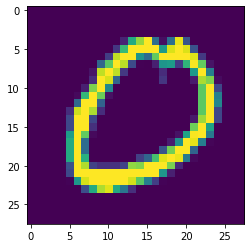

In [55]:
plt.imshow(df.iloc[13051,1:].values.reshape(28,28))

In [56]:
X=df.iloc[:,1:]
y=df.iloc[:,0]

In [57]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [58]:
X_train.shape

(33600, 784)

In [59]:
from sklearn.neighbors import KNeighborsClassifier

In [60]:
knn=KNeighborsClassifier()

In [61]:
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [62]:
import time 
start=time.time()
y_pred=knn.predict(X_test)
print(time.time()-start)

5.793458938598633


In [63]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9648809523809524

In [64]:
from sklearn.preprocessing import StandardScaler
scaler= StandardScaler()

In [65]:
X_train=scaler.fit_transform(X_train)
X_test=scaler.transform(X_test)

In [66]:
#PCA
from sklearn.decomposition import PCA
#none give same number of pca corresponding to total number of columns present
pca=PCA(n_components=200)

In [67]:
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [74]:
X_train_trf.shape

(33600, 39)

In [69]:
#not using transform coz already being fit and transformed
knn.fit(X_train_trf,y_train)

KNeighborsClassifier()

In [70]:
y_pred=knn.predict(X_test_trf)

In [71]:
accuracy_score(y_test,y_pred)

0.9510714285714286

In [ ]:
for i in range(1,785):
    pca=PCA(n_components=i)
    
    X_train_trf=pca.fit_transform(X_train)
    X_test_trf=pca.transform(X_test)
    
    knn.fit(X_train_trf,y_train)
    y_pred=knn.predict(X_test_trf)
    print(accuracy_score(y_test,y_pred))

In [75]:
# transforming to a 2D coordinate System
pca= PCA(n_components=2)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [76]:
X_train_trf

array([[-2.71862148, -0.48932526],
       [-0.67700658, -6.75438898],
       [-3.03324   ,  6.50969564],
       ...,
       [ 2.14881073,  0.77969645],
       [ 1.05959117,  0.94864444],
       [17.70259179,  1.96188547]])

In [77]:
import plotly.express as px
y_train_trf=y_train.astype(str)
fig=px.scatter(x=X_train_trf[:,0],
              y=X_train_trf[:,1],
              color=y_train_trf,
              color_discrete_sequence=px.colors.qualitative.G10
              )
fig.show()

In [78]:
# transforming to a 3D
pca= PCA(n_components=3)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [80]:
y_train_trf = y_train.astype(str)
fig= px.scatter_3d(df, x=X_train_trf[:,0],
                       y=X_train_trf[:,1],
                       z=X_train[:,2],
                      color=y_train_trf)
fig.update_layout(
    margin=dict(l=20,r=20,t=20,b=20),
    paper_bgcolor='LightSteelBlue',
)
fig.show()

In [81]:
#Eigen Values = lambda
pca.explained_variance_

array([40.67111197, 29.17023342, 26.74459608])

In [84]:
#eigen Vectors
pca.components_.shape

(3, 784)

In [86]:
# ratio basically shows percentage in your dataset
pca.explained_variance_ratio_*100

array([5.78519225, 4.1492696 , 3.80423899])

In [87]:
pca= PCA(n_components=None)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [88]:
pca.explained_variance_.shape

(784,)

In [90]:
pca.components_.shape

(784, 784)

In [93]:
np.cumsum(pca.explained_variance_ratio_)

array([0.05785192, 0.09934462, 0.13738701, 0.16704964, 0.19286525,
       0.21541506, 0.23514574, 0.25289854, 0.26858504, 0.28294568,
       0.29664822, 0.30892077, 0.32038989, 0.33162017, 0.34220546,
       0.35240477, 0.36198153, 0.37140862, 0.38053351, 0.38943521,
       0.39783462, 0.40603525, 0.41388828, 0.42145568, 0.42882829,
       0.43584714, 0.44282633, 0.44953738, 0.45593583, 0.4622392 ,
       0.46839271, 0.4744166 , 0.48025334, 0.48603881, 0.49176214,
       0.49722614, 0.50265822, 0.50793994, 0.51307376, 0.51801392,
       0.52289063, 0.52771041, 0.53239246, 0.53698588, 0.54156249,
       0.54605468, 0.5505015 , 0.55491691, 0.55926803, 0.56358836,
       0.56780645, 0.57198888, 0.57606882, 0.58008887, 0.58407223,
       0.58801822, 0.59188694, 0.59571889, 0.59948441, 0.60322635,
       0.60687487, 0.6104829 , 0.61402176, 0.61750117, 0.62094441,
       0.62432378, 0.62767368, 0.63099377, 0.63426257, 0.63746765,
       0.64065542, 0.64376931, 0.64686564, 0.64992395, 0.65296

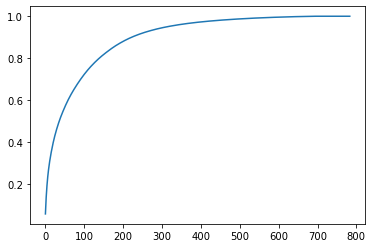

In [94]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))